<a href="https://colab.research.google.com/github/dsl-unibe-ch/machine-learning/blob/master/6_ML_SL_NNs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine learning - Introduction to Neural Networks

**Lecturer:** Ana Stojiljkovic, DVM PhD  
Data Science Lab, University of Bern | 2026

---
## Deep learning

So far, we have explored several machine learning methods. Now, we are going to build a **deep neural network**. Here, we construct a network of connected **neurons** arranged in **layers** and let it learn its own internal representations of the relationships between our input data and the expected output **label**. By adjusting its **trainable parameters**, the network gradually learns how to arrive at the correct output.

**The network has to learn that for itself** through an iterative process. By making predictions, seeing how far they are from what we expected, and gradually adjusting its connections, it can learn to make better predictions of the expected output.

Our role is to build the **architecture** that makes this learning possible. We choose a starting design, see how well it learns, and then return to that design, changing and refining it as we search for an architecture that can solve the task. A fundamental part of this process is checking how well the trained model can carry what it has learned to examples it has never seen before (**validation**).

![Machine learning algorithm selection guide](figures/cheatsheet.png)

*Source: [scikit-learn algorithm selection guide](https://scikit-learn.org/stable/machine_learning_map.html).*

## 1. Learning outcomes

By the end of this session, you will be able to:

- Explain how a neuron combines **weights, a bias, and an activation function**.
- Describe the architecture of a fully connected feed-forward network.
- Choose an output activation and loss for regression or classification.
- Explain how **gradient descent and backpropagation** train a network.
- Distinguish learned parameters from hyperparameters, and recognize underfitting and overfitting.
- Train a small neural network and evaluate its predictions on unseen data.

## 2. The artificial neuron

### 2.1 The perceptron

The first **single neuron network** was proposed already in 1958 by AI pioneer Frank Rosenblatt. The biological analogy is simple: a neuron combines multiple incoming signals and produces only one output.

An artificial neuron gives each input a **weight**, adds a **bias**, and applies an **activation function**. The original perceptron used a threshold to make a binary decision.

*Historical source from the lecture: [Cornell University, Rosenblatt's perceptron](https://news.cornell.edu/stories/2019/09/professors-perceptron-paved-way-ai-60-years-too-soon).*

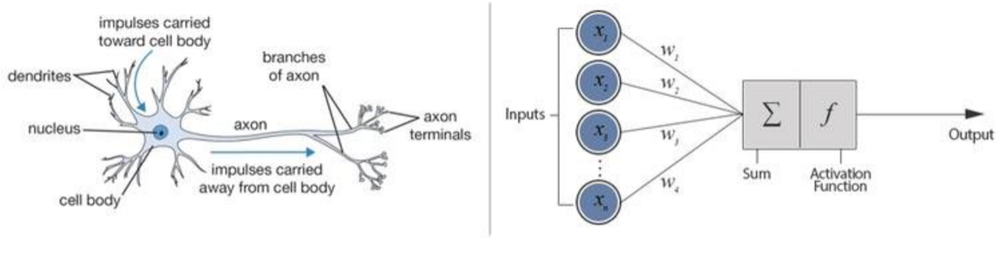

### 2.2 A familiar starting point: **linear regression**

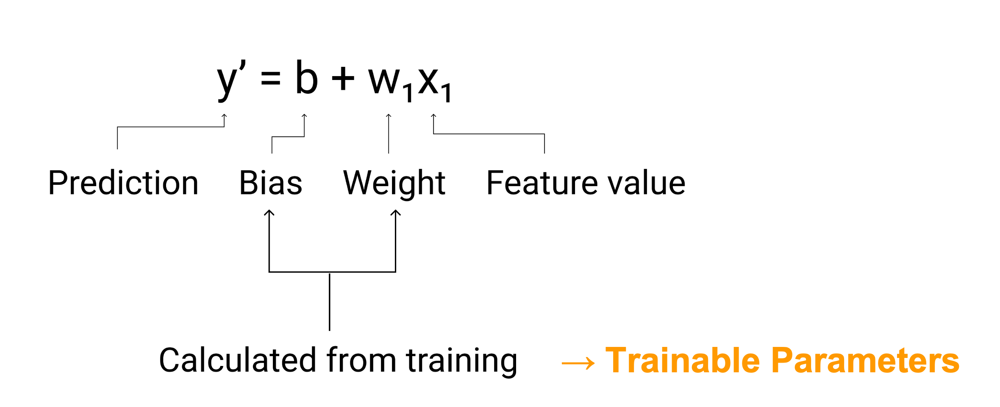

With one feature, a linear model predicts:

$$\hat{y}=b+w_1x_1$$

With $D$ features, the weighted input is:

$$z=b+\sum_{j=1}^{D}w_jx_j=\mathbf{w}^{\mathsf T}\mathbf{x}+b$$

| Symbol | Meaning | Learned during training? |
|---|---|---|
| $x_j$ | Input feature value | No |
| $w_j$ | Weight of feature $j$ | Yes |
| $b$ | Bias, or intercept | Yes |
| $z$ | Weighted sum before activation | Computed from the inputs and parameters |

**Weights and biases are the trainable parameters.**

*Source from the lecture: [Google Machine Learning Crash Course, linear regression](https://developers.google.com/machine-learning/crash-course/linear-regression).*

## 3. Activation functions
**Nonlinear activations let a network represent nonlinear relationships.** Stacking linear layers alone still produces a linear transformation.

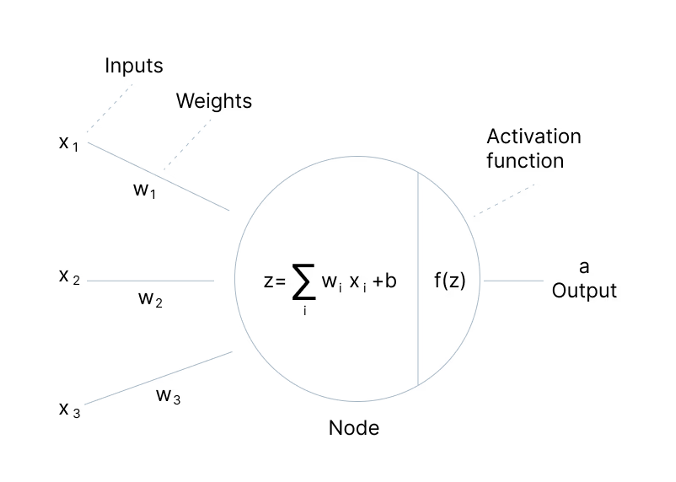



A neuron applies an activation $g$ to its weighted input:

$$a=g(z)=g\!\left(b+\sum_{j=1}^{D}w_jx_j\right)$$

### 3.1 Hidden-layer activations

An activation controls the neuron's response. The idea that it “fires” is useful intuition, but many activations return a continuous value.

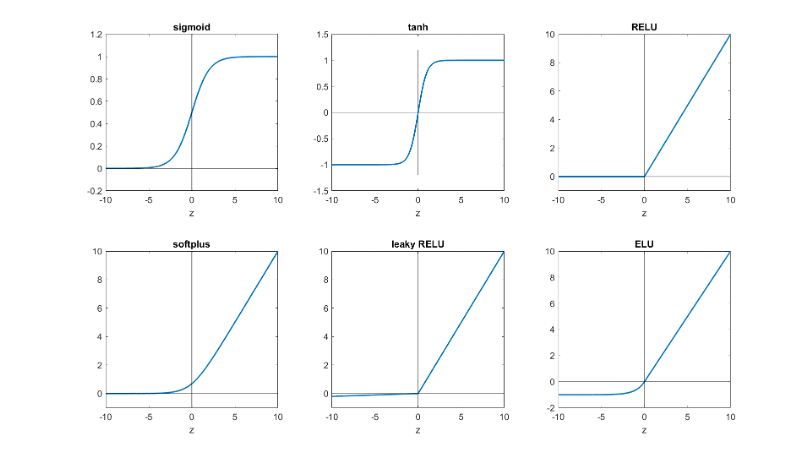

| Activation | Output range |
|---|---|
| Sigmoid | $(0,1)$ |
| Hyperbolic tangent | $(-1,1)$ |
| ReLU | $[0,\infty)$ |
| Softplus | $(0,\infty)$ |
| Leaky ReLU | $\mathbb{R}$ |
| ELU | $(-\lambda,\infty)$ |

$$\begin{aligned}
\text{Sigmoid:}\quad &\sigma(z)=\frac{1}{1+e^{-z}} \\
\text{Tanh:}\quad &g(z)=\tanh(z) \\
\text{ReLU:}\quad &g(z)=\max(0,z) \\
\text{Softplus:}\quad &g(z)=\log(1+e^z) \\
\text{Leaky ReLU:}\quad &g(z)=\max(\lambda z,z),\quad 0<\lambda<1 \\
\text{ELU:}\quad &g(z)=\begin{cases}z&z>0\\\lambda(e^z-1)&z\leq0\end{cases},\quad \lambda>0
\end{aligned}$$

ReLU is a common choice for hidden layers. Sigmoid and tanh become nearly flat for large input magnitudes, which can make their gradients very small.

### 3.2 Output-layer activations depend on the task

| Task | Output activation | Interpretation |
|---|---|---|
| Regression | Linear, $g(z)=z$ | An unrestricted numerical prediction |
| Binary classification | Sigmoid | Probability of the positive class |
| Multiclass classification, one class per observation | Softmax | One probability per class, summing to 1 |

For regression with a constrained target, an activation can enforce a suitable range: sigmoid for a value between 0 and 1, or ReLU for a nonnegative output.

For $K$ mutually exclusive classes:

$$p_k=\operatorname{softmax}(\mathbf z)_k
=\frac{e^{z_k}}{\sum_{j=1}^{K}e^{z_j}},
\qquad \sum_{k=1}^{K}p_k=1$$

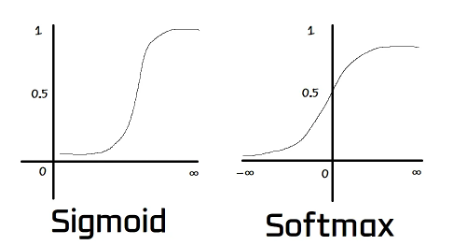

*The softmax sketch is schematic: softmax acts on a vector of class scores. A class probability depends on all those scores, not on one input alone.*

## 4. Neural network architecture

### 4.1 Fully connected feed-forward networks

In a **fully connected** (dense) network, each neuron connects to every neuron in the next layer. During prediction, information flows in one direction: input, hidden layers, then output.

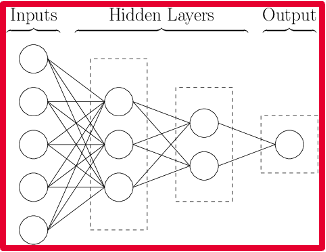

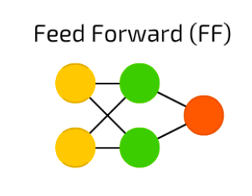

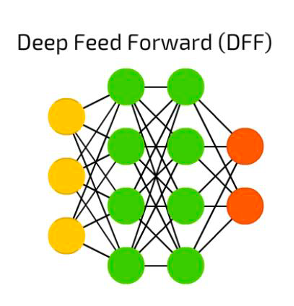

*A deep network has multiple hidden layers, allowing successive transformations of the inputs.*

### 4.2 Architecture vocabulary

| Term | Meaning |
|---|---|
| Input layer | Receives the features of one observation |
| Hidden layer | Transforms the previous layer's outputs |
| Output layer | Produces the prediction |
| Unit / neuron | Computes a weighted sum followed by an activation |
| Width | Number of units in a layer |
| Depth | Number of successive layers; specify whether the output layer is counted |

Neurons within a layer can be computed together. Successive layers depend on the previous layer's result.

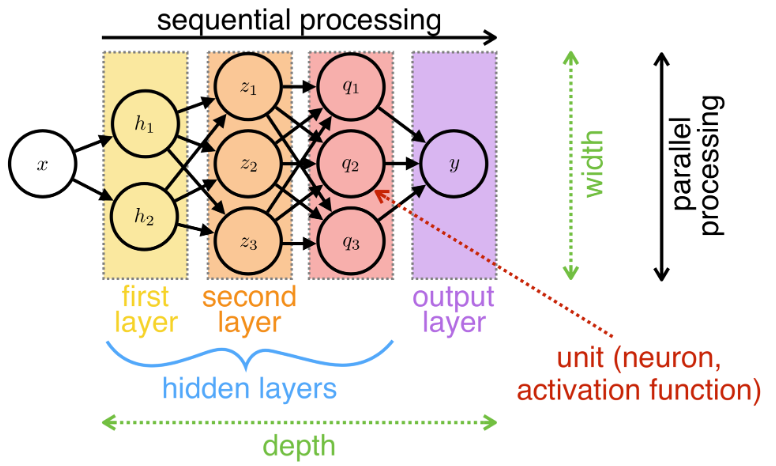

For layer $\ell$:

$$\mathbf a^{(\ell)}=g^{(\ell)}\!\left(W^{(\ell)}\mathbf a^{(\ell-1)}+\mathbf b^{(\ell)}\right),
\qquad \mathbf a^{(0)}=\mathbf x$$

A dense layer with $d_{\rm in}$ inputs and $d_{\rm out}$ units has
$(d_{\rm in}+1)d_{\rm out}$ trainable parameters, including one bias per unit.

<span style="color: #ff0000;"><strong>Check your understanding:</strong> How many trainable parameters does a fully connected network with 2 inputs, one hidden layer of 4 neurons, and 1 output neuron have, including biases?</span>

## 5. How does a neural network learn?

Training repeats a short cycle:

1. **Forward propagation:** compute predictions from the current weights and biases.
2. **Loss calculation:** compare predictions with the true targets.
3. **Backpropagation:** calculate how each parameter affects the loss.
4. **Optimization:** update the parameters to reduce the loss.

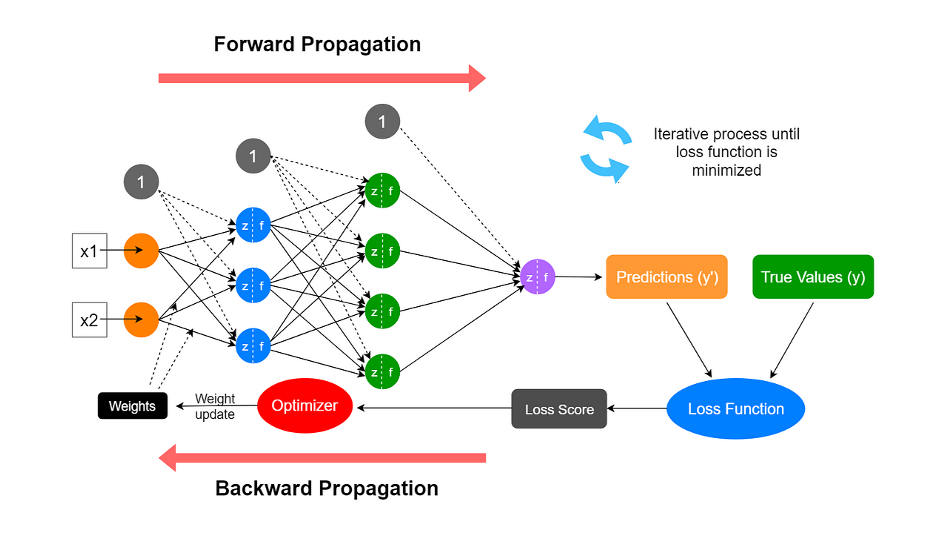

| Term | Meaning |
|---|---|
| Batch | A group of training examples processed together |
| Step | One parameter update using a batch |
| Epoch | One complete pass through the training data |

With 1,000 training examples and a batch size of 100, one epoch contains 10 steps. An epoch usually contains many updates.

### 5.1 Loss and cost functions

The **loss** $L(\hat y,y)$ measures the error for one example. The **cost** $J$ averages this loss over the $m$ training examples:

$$J(W,b)=\frac{1}{m}\sum_{i=1}^{m}L\!\left(\hat y^{(i)},y^{(i)}\right)$$

The loss defines what “error” means for the task. **A lower value is better** when comparing the same loss on the same data. In software, “loss” often also refers to the average over a batch or dataset.

### 5.2 Common loss functions

| Task | Loss | Main idea |
|---|---|---|
| Regression | Squared error | Large residuals receive a larger penalty |
| Binary classification | Binary cross-entropy | Penalizes incorrect predicted probabilities |
| Multiclass classification | Categorical cross-entropy | Penalizes low probability for the true class |

For one observation:

$$\begin{aligned}
L_{\rm squared}&=(\hat y-y)^2\\[6pt]
L_{\rm binary}&=-[y\log p+(1-y)\log(1-p)]\\[6pt]
L_{\rm categorical}&=-\sum_{k=1}^{K}y_k\log p_k
\end{aligned}$$

The mean squared error (**MSE**) is the average squared error. For binary cross-entropy, $y$ is 0 or 1 and $p$ is the predicted probability of class 1. For categorical cross-entropy, $y_k$ is a one-hot target.

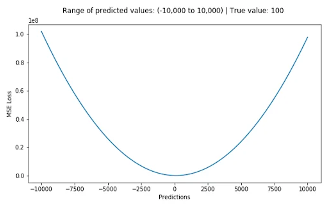

*The minimum occurs when the prediction equals the target.*

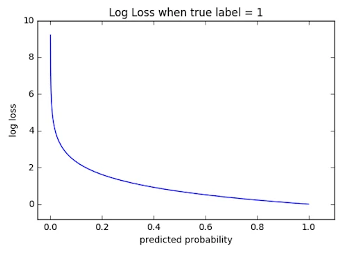

*For a true positive label, predicting a probability close to zero receives a large penalty.*

### 5.3 Optimization and gradient descent

Training seeks parameters $\theta$ (all weights and biases) that minimize $J(\theta)$. For a neural network, we usually search iteratively.

$$\theta_{t+1}=\theta_t-\eta\,\nabla_\theta J_{\mathcal B_t}(\theta_t)$$

Here $\mathcal B_t$ is the current batch and $\eta$ is the **learning rate**. The gradient points toward increasing cost, so the update moves in the opposite direction.

A small learning rate can make progress slow. A large learning rate can overshoot. Random initialization, batch size, batch order, and noisy data all affect the optimization path.

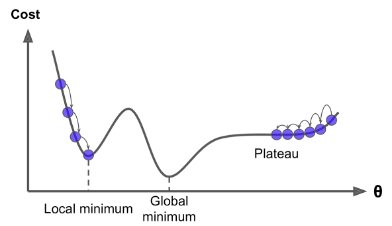

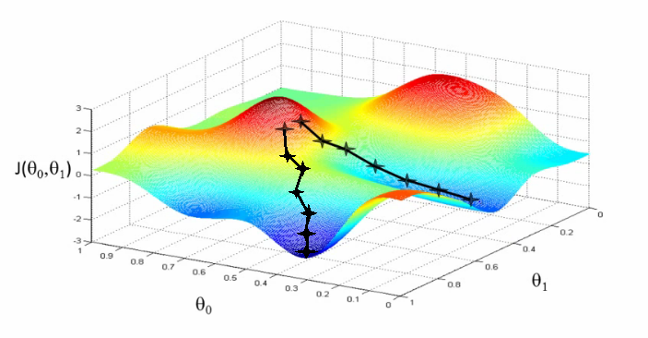

*A low-dimensional illustration of a cost landscape. A real network may have thousands or millions of parameters.*

At each point in the cost landscape, we need to know **which way to move** if we want to reduce the cost.

The **gradient** tells us how the cost would change if we slightly changed each trainable parameter. Since the parameters are collected in the vector $\theta$, the gradient is also a vector:

$$
\nabla_\theta J(\theta)
=
\left(
\frac{\partial J}{\partial \theta_1},
\frac{\partial J}{\partial \theta_2},
\ldots,
\frac{\partial J}{\partial \theta_n}
\right)
$$

Each component answers a small question:

> If we change this particular weight or bias, how will the cost change?

The gradient points in the direction in which the cost increases most rapidly. To reduce the cost, we therefore move in the **opposite direction**:

$$
\theta_{\mathrm{new}}
=
\theta_{\mathrm{old}}
-
\eta \nabla_\theta J(\theta_{\mathrm{old}})
$$

The learning rate $\eta$ controls how strongly we respond to the gradient.

In a neural network, **backpropagation calculates the gradient**, and the **optimizer uses it to update the weights and biases**. After the update, the network makes another prediction with this new parameter configuration, and the process begins again.

### 5.4 Backpropagation

**Backpropagation computes gradients using the chain rule.** The optimizer then uses those gradients to change the parameters.

For one weight and one bias, the gradient-descent updates are:

$$w_{\rm new}=w_{\rm old}-\eta\frac{\partial J}{\partial w},
\qquad b_{\rm new}=b_{\rm old}-\eta\frac{\partial J}{\partial b}$$

For a neuron $a=g(z)$ with $z=wx+b$, the chain rule gives:

$$\frac{\partial L}{\partial w}
=\frac{\partial L}{\partial a}\,
\frac{\partial a}{\partial z}\,
\frac{\partial z}{\partial w}$$

Where $\eta$ is the learning rate.

We monitor progress across epochs. Small improvements do not prove that we reached the global minimum. Training may stop at an epoch limit, a convergence tolerance, or an early-stopping criterion based on validation performance.

## 6. Parameters and hyperparameters

**Parameters** are learned during fitting. **Hyperparameters** control the architecture or training process and are chosen outside the parameter-update loop.

| Category | Examples | How are they determined? |
|---|---|---|
| **Learned parameters** | Connection weights and neuron biases | Updated during training by the optimizer |
| **Hyperparameters** | Number of layers, units per layer, activation functions, learning rate, batch size, maximum epochs, regularization strength | Chosen by us and compared using validation data |

Compare hyperparameter choices on a **validation set** or through cross-validation. Reserve the test set for the final evaluation.

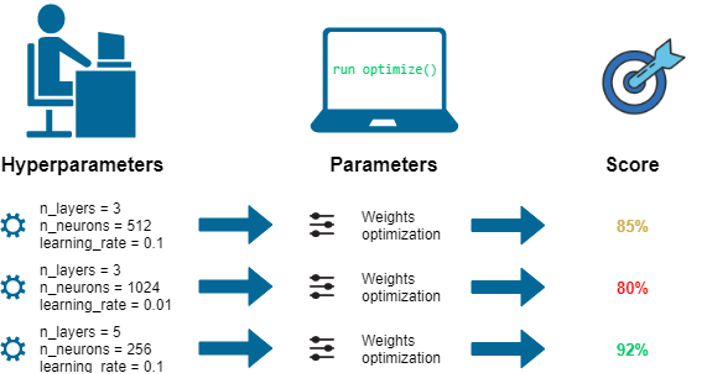

| Example configuration | Hidden layers | Units (as labelled in the figure) | Learning rate | Illustrative score |
|---|---:|---:|---:|---:|
| 1 | 3 | 512 | 0.1 | 85% |
| 2 | 3 | 1,024 | 0.01 | 80% |
| 3 | 5 | 256 | 0.1 | 92% |

*Illustration source from the lecture: [AI Online Course, hyperparameter tuning](https://www.aionlinecourse.com/tutorial/deep-learning/hyperparameter-tuning-techniques).*

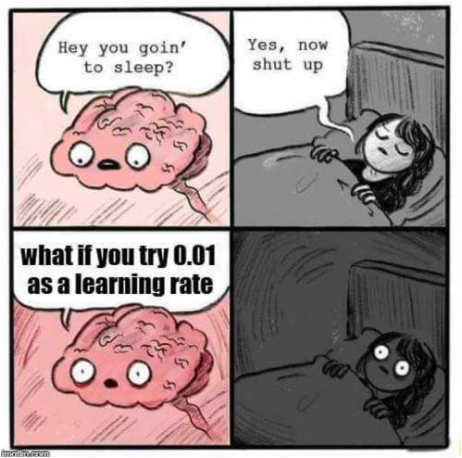

## 7. Evaluation and generalization

A model should perform well on **new observations**. Performance on the data used for fitting is insufficient.

| Dataset | What do we use it for? | What changes based on it? |
|---|---|---|
| **Training set** | Learn from examples | The optimizer updates weights and biases |
| **Validation set** | Compare architectures and training settings, or decide when to stop training | We adjust our modelling choices |
| **Test set** | Evaluate the chosen model on untouched examples | We report its final performance |

Use a split appropriate to the data. Repeated observations from the same individual should remain together, and time-dependent tasks may require chronological splits.

For regression, MSE measures numerical prediction error. For classification, the useful metric depends on the consequences of false positives and false negatives.

### 7.1 Classification metrics

During training, the **loss function** guides the updates to the network’s weights and biases. But how do we describe the predictions the model gets right or wrong?

A **confusion matrix** compares predicted classes with true labels, counting correct predictions, false positives, and false negatives. From these counts, we calculate metrics such as **accuracy, precision, recall, specificity, and F1**.

We use these metrics on the **validation set** to compare models during development, and on the **test set** to evaluate the final model.

| Actual class | Predicted positive | Predicted negative |
|---|---|---|
| Positive | True positive (**TP**) | False negative (**FN**), missed positive |
| Negative | False positive (**FP**), false alarm | True negative (**TN**) |

| Metric | Interpretation |
|---|---|
| Accuracy | Fraction of all predictions that are correct |
| Sensitivity / recall | Fraction of actual positives detected |
| Specificity | Fraction of actual negatives correctly rejected |
| Precision | Fraction of predicted positives that are correct |
| Negative predictive value (NPV) | Fraction of predicted negatives that are correct |
| F1 score | Harmonic mean of precision and recall |

$$\begin{aligned}
\mathrm{Accuracy}&=\frac{TP+TN}{TP+TN+FP+FN}
&\mathrm{Recall}&=\frac{TP}{TP+FN}\\[6pt]
\mathrm{Specificity}&=\frac{TN}{TN+FP}
&\mathrm{Precision}&=\frac{TP}{TP+FP}\\[6pt]
\mathrm{NPV}&=\frac{TN}{TN+FN}
&F_1&=\frac{2TP}{2TP+FP+FN}
\end{aligned}$$

$$F_1=\frac{2\,\mathrm{precision}\,\mathrm{recall}}{\mathrm{precision}+\mathrm{recall}}$$

### 7.2 Evaluating a regression model

For regression, we predict a **numerical value** rather than a class. We therefore measure how far the predictions are from the true values.

| Metric | What does it tell us? |
|---|---|
| **Mean Absolute Error (MAE)** | The average absolute difference between predictions and true values, in the same units as the target |
| **Mean Squared Error (MSE)** | The average squared difference, giving larger errors a stronger penalty |
| **Root Mean Squared Error (RMSE)** | The square root of MSE, bringing the error back to the target’s original units |

**Lower values mean smaller prediction errors.** For example, an MAE of 2 cm means that predictions differ from the true measurements by 2 cm on average.

MSE can serve as both the **training loss** and an **evaluation metric**. The distinction is its role: during training it guides parameter updates; on validation or test data it measures performance on unseen examples.

### 7.3 Underfitting, overfitting, bias and variance

**Underfitting:** the model misses relevant structure and performs poorly even on training data. It often reflects high bias.

**Overfitting:** the model fits details of the training sample that do not generalize. It often reflects high variance.

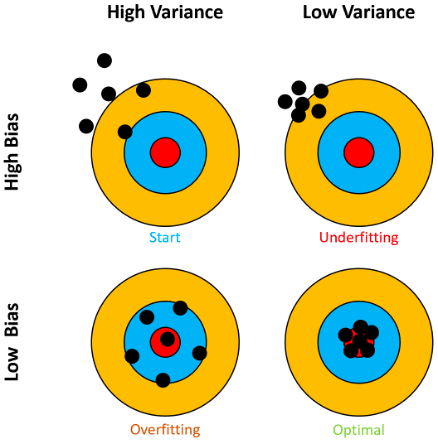

*Bias is a systematic error. Variance describes how much the fitted model changes across training samples.*

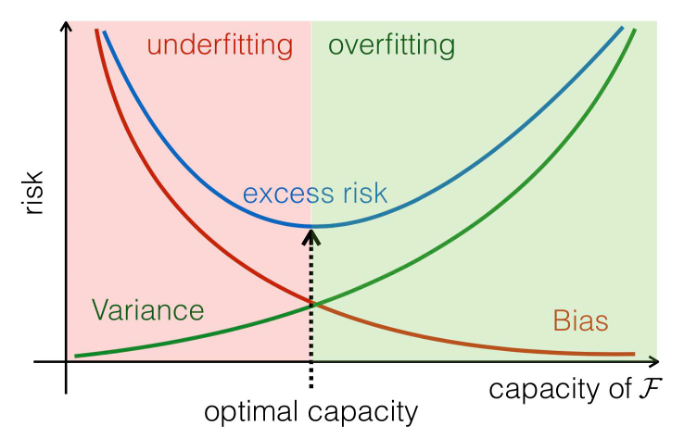

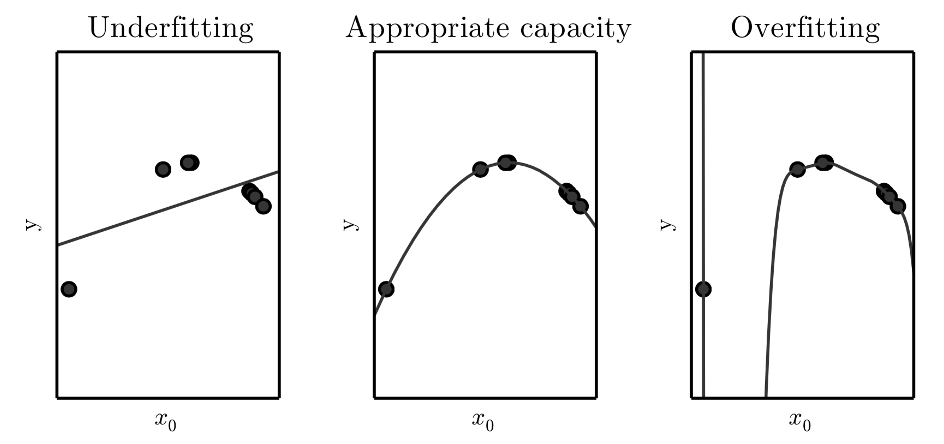

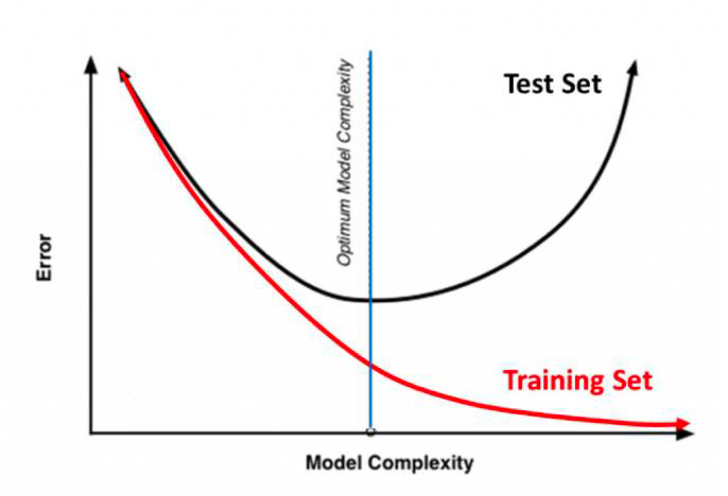

*The original figure labels the held-out curve “Test Set”. When choosing complexity, use validation data for this curve and keep the final test set untouched.*

Training error alone cannot identify the best model. Compare it with validation error.

| Observation | Possible next step |
|---|---|
| Training and validation errors both high | Check features, optimization, or model capacity |
| Training error low, validation error much higher | Try stronger regularization, fewer units, or more representative training data |
| Validation loss rises while training loss falls | Consider early stopping |

These curves are conceptual examples. More complex networks do not always follow the same pattern.

## 8. Hands-on neural networks

We will learn to fit a one-dimensional function, predict house prices, and classify Fashion-MNIST images. We will also watch predictions evolve during training and save and reload trained models.

*Examples and exercise adapted from Mykhailo Vladymyrov and Aris Marcolongo, Data Science Lab, University of Bern (2023), [DSF5 course materials](https://github.com/neworldemancer/DSF5), licensed under [CC0](https://creativecommons.org/publicdomain/zero/1.0/).*

We use **PyTorch** to define and train the networks, and scikit-learn for data loading, preprocessing, and evaluation. Fashion-MNIST is downloaded from **OpenML** on the first run and cached for later use. No GPU is needed, although training and validating on the 60,000 development images can take a few minutes.

### Load the libraries

In [1]:
# Uncomment once if the libraries are missing.
# %pip install numpy pandas matplotlib scikit-learn torch

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score, log_loss

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)
plt.rcParams.update({'figure.figsize': (8, 5), 'font.size': 11})

<h3 style="color: #ff0000;">8.1 First example: regression with a 1D input</h3>

We start with a step-shaped function. The network receives one number and learns to predict its corresponding value.

This first example illustrates fitting a function. We use all its points for training, so these plots show **training performance**, not an estimate of generalization.

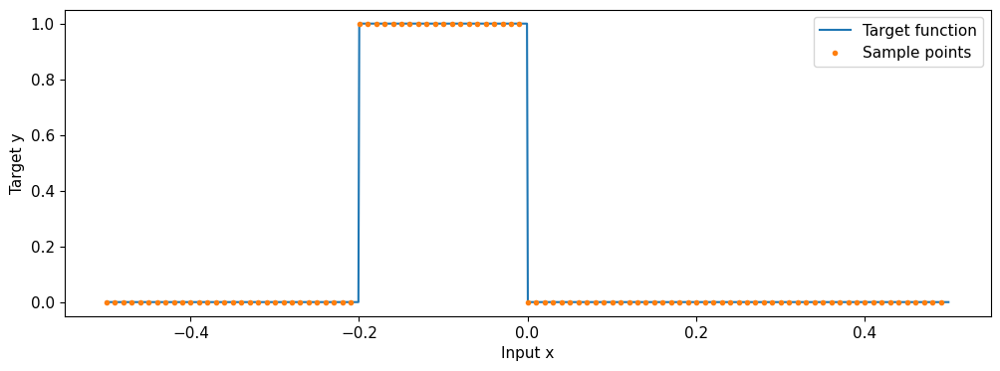

In [2]:
x_1d = np.linspace(0, 10, num=1000)
y_1d = ((x_1d > 3) & (x_1d < 5)).astype(float)
# Alternative target to try: y_1d = x_1d**3 / 500 + np.sin(x_1d)
x_1d = x_1d / 10 - 0.5
X_1d = x_1d.reshape(-1, 1)  # Shape: (observations, features)

fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(x_1d, y_1d, label='Target function')
ax.plot(x_1d[::10], y_1d[::10], 'o', markersize=3, label='Sample points')
ax.set(xlabel='Input x', ylabel='Target y')
ax.legend()
plt.show()

The model has **one input, a hidden layer with 100 ReLU neurons, and one linear output**. `nn.Linear` contains the trainable weights and biases, `nn.ReLU` applies the activation, and `nn.Sequential` connects the layers in order.

We use **MAE as the training loss**. In PyTorch this is `nn.L1Loss()`. We also record MSE as an evaluation metric.

PyTorch works with **tensors**, arrays of numbers similar to NumPy arrays. We convert inputs and regression targets to `float32` tensors. `TensorDataset` pairs each input with its target, and `DataLoader` divides these pairs into shuffled batches.

In [3]:
torch.manual_seed(RANDOM_STATE)
model_1d = nn.Sequential(
    nn.Linear(1, 100),
    nn.ReLU(),
    nn.Linear(100, 1),
)
loss_1d = nn.L1Loss()  # Mean absolute error
optimizer_1d = torch.optim.Adam(model_1d.parameters(), lr=0.01)

X_1d_tensor = torch.tensor(X_1d, dtype=torch.float32)
y_1d_tensor = torch.tensor(y_1d, dtype=torch.float32).reshape(-1, 1)
loader_1d = DataLoader(
    TensorDataset(X_1d_tensor, y_1d_tensor), batch_size=100, shuffle=True,
)
print(model_1d)
print('Trainable parameters:', sum(p.numel() for p in model_1d.parameters()))

Sequential(
  (0): Linear(in_features=1, out_features=100, bias=True)
  (1): ReLU()
  (2): Linear(in_features=100, out_features=1, bias=True)
)
Trainable parameters: 301


### The training loop

For every batch, we **make predictions**, calculate the loss, calculate gradients with **backpropagation**, and let the optimizer **update the weights and biases**.

`optimizer.zero_grad()` clears gradients from the previous batch because PyTorch otherwise accumulates them. `loss.backward()` computes new gradients, and `optimizer.step()` updates the parameters.

The short function below performs **one epoch**. We reuse it for all three examples, changing only the model, loss, optimizer, and data.

For evaluation we use `model.eval()` and `torch.no_grad()`: we evaluate the current model without building a gradient computation graph. These calls do not train the model.

In [30]:
def train_one_epoch(model, loader, loss_function, optimizer):
    model.train()
    for inputs, targets in loader:
        optimizer.zero_grad()                 # Clear previous gradients
        predictions = model(inputs)           # Forward pass
        loss = loss_function(predictions, targets)
        loss.backward()                       # Backpropagation
        optimizer.step()                      # Update weights and biases


n_epochs_1d = 1000
history_1d = {'mae': [], 'mse': []}
predictions_1d, saved_epochs_1d = [], []

for epoch in range(1, n_epochs_1d + 1):
    train_one_epoch(model_1d, loader_1d, loss_1d, optimizer_1d)
    model_1d.eval()
    with torch.no_grad():
        prediction = model_1d(X_1d_tensor).numpy().ravel()
    history_1d['mae'].append(mean_absolute_error(y_1d, prediction))
    history_1d['mse'].append(mean_squared_error(y_1d, prediction))
    if epoch == 1 or epoch % 10 == 0:
        predictions_1d.append(prediction.copy())
        saved_epochs_1d.append(epoch)

print(f"Final training MAE: {history_1d['mae'][-1]:.4f}")
print(f"Final training MSE: {history_1d['mse'][-1]:.4f}")

Final training MAE: 0.0739
Final training MSE: 0.0145


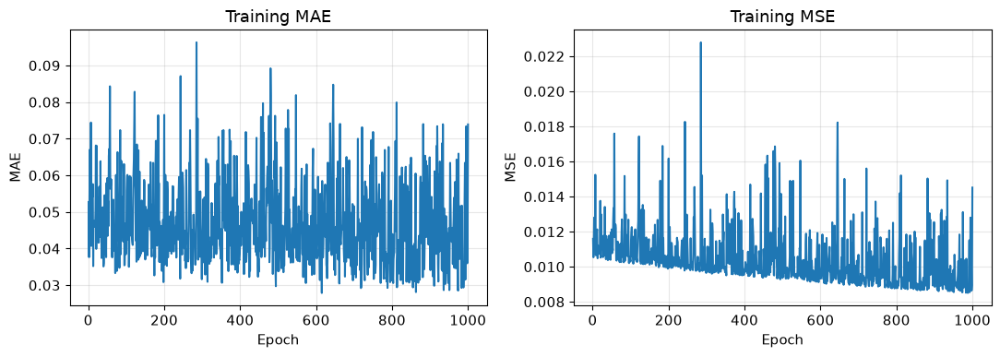

In [31]:
epochs_1d = np.arange(1, n_epochs_1d + 1)
fig, axes = plt.subplots(1, 2, figsize=(11, 4))
for ax, metric in zip(axes, ['mae', 'mse']):
    ax.plot(epochs_1d, history_1d[metric])
    ax.set(xlabel='Epoch', ylabel=metric.upper(), title=f'Training {metric.upper()}')
    ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

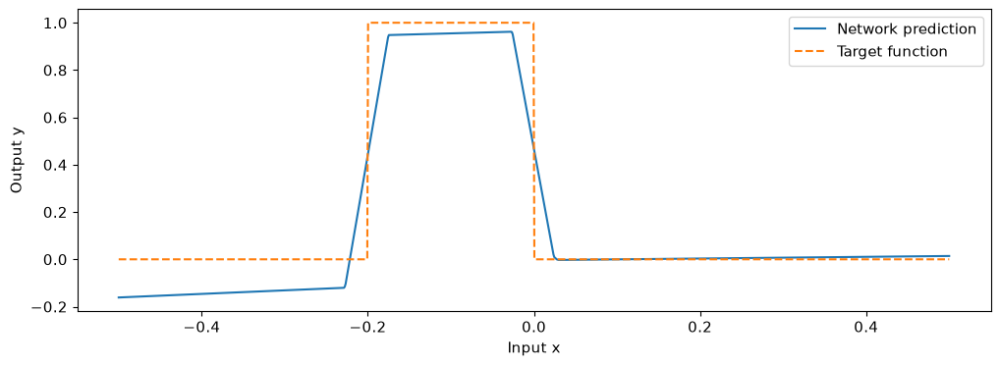

In [32]:
model_1d.eval()
with torch.no_grad():
    final_prediction_1d = model_1d(X_1d_tensor).numpy().ravel()

fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(x_1d, final_prediction_1d, label='Network prediction')
ax.plot(x_1d, y_1d, '--', label='Target function')
ax.set(xlabel='Input x', ylabel='Output y')
ax.legend()
plt.show()

### Watch the predictions change during training

Use the animation controls to follow the network's predictions over successive epochs.

In [33]:
from matplotlib import animation
from IPython.display import HTML, display

fig, ax = plt.subplots(figsize=(10, 4))
line_1d, = ax.plot(x_1d, predictions_1d[0], label='Prediction')
ax.plot(x_1d, y_1d, '--', label='Target')
all_predictions_1d = np.asarray(predictions_1d)
ax.set(xlabel='Input x', ylabel='Output y',
       ylim=(min(0, all_predictions_1d.min()) - 0.1,
             max(1, all_predictions_1d.max()) + 0.1))
ax.legend()
title_1d = ax.set_title('')

def animate_1d(frame):
    line_1d.set_ydata(predictions_1d[frame])
    title_1d.set_text(f'Epoch {saved_epochs_1d[frame]}')
    return line_1d, title_1d

animation_1d = animation.FuncAnimation(
    fig, animate_1d, frames=len(predictions_1d), interval=100,
)
plt.close(fig)
display(HTML(animation_1d.to_jshtml()))

<h3 style="color: #ff0000;">8.2 Second example: house prices with a fully connected network</h3>

We now load the **Ames Housing** data used in the original course. We retain its 24 selected features and its numerical coding of the categorical features.

The cell looks for the course CSV beside the notebook or in `machine-learning/data`. If needed, it downloads just this CSV from the original course repository.

In [34]:
from pathlib import Path
from urllib.request import urlretrieve

house_candidates = [Path('data/AmesHousing.csv'), Path('machine-learning/data/AmesHousing.csv')]
house_path = next((p for p in house_candidates if p.exists()), None)
if house_path is None:
    house_path = Path('data/AmesHousing.csv')
    house_path.parent.mkdir(parents=True, exist_ok=True)
    urlretrieve(
        'https://raw.githubusercontent.com/neworldemancer/DSF5/master/data/AmesHousing.csv',
        house_path,
    )

houses = pd.read_csv(house_path, na_values=['NaN', ''], keep_default_na=False)
houses.columns = houses.columns.str.replace(' ', '', regex=False).str.replace('/', '', regex=False)
features = [
    'LotArea', 'Utilities', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
    'ExterQual', 'ExterCond', 'HeatingQC', 'CentralAir', 'Electrical',
    '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'FullBath', 'HalfBath',
    'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
    'Functional', 'PoolArea', 'YrSold', 'MoSold',
]
houses = houses.dropna(subset=features + ['SalePrice'])
quality_codes = {'Po': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4}
category_codes = {
    'Utilities': {'ELO': 0, 'NoSeWa': 1, 'NoSewr': 2, 'AllPub': 3},
    'ExterQual': quality_codes, 'ExterCond': quality_codes,
    'HeatingQC': quality_codes, 'KitchenQual': quality_codes,
    'CentralAir': {'N': 0, 'Y': 1},
    'Electrical': {'NA': 0, 'Mix': 1, 'FuseP': 2, 'FuseF': 3, 'FuseA': 4, 'SBrkr': 5},
    'Functional': {'Sal': 0, 'Sev': 1, 'Maj2': 2, 'Maj1': 3, 'Mod': 4,
                   'Min2': 5, 'Min1': 6, 'Typ': 7},
}
X_house = houses[features].copy()
for column, mapping in category_codes.items():
    X_house[column] = X_house[column].map(mapping)
X_house = X_house.astype(float)
y_house = houses['SalePrice'].to_numpy(dtype=float)
print('Input shape:', X_house.shape)
X_house.head()

Input shape: (2929, 24)


,LotArea,Utilities,OverallQual,OverallCond,YearBuilt,YearRemodAdd,ExterQual,ExterCond,HeatingQC,CentralAir,...,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,PoolArea,YrSold,MoSold
0,31770.0,3.0,6.0,5.0,1960.0,1960.0,2.0,2.0,1.0,1.0,...,1.0,0.0,3.0,1.0,2.0,7.0,7.0,0.0,2010.0,5.0
1,11622.0,3.0,5.0,6.0,1961.0,1961.0,2.0,2.0,2.0,1.0,...,1.0,0.0,2.0,1.0,2.0,5.0,7.0,0.0,2010.0,6.0
2,14267.0,3.0,6.0,6.0,1958.0,1958.0,2.0,2.0,2.0,1.0,...,1.0,1.0,3.0,1.0,3.0,6.0,7.0,0.0,2010.0,6.0
3,11160.0,3.0,7.0,5.0,1968.0,1968.0,3.0,2.0,4.0,1.0,...,2.0,1.0,3.0,1.0,4.0,8.0,7.0,0.0,2010.0,4.0
4,13830.0,3.0,5.0,5.0,1997.0,1998.0,2.0,2.0,3.0,1.0,...,2.0,1.0,3.0,1.0,2.0,6.0,7.0,0.0,2010.0,3.0


We set aside **20% for final testing**, then use 25% of the remaining data for validation. This gives a 60/20/20 split.

We fit the input scaler on the **training set only**. We also scale the target prices to help optimization, then convert predictions back to dollars for all the error plots.

In [35]:
Xh_dev, Xh_test_raw, yh_dev, yh_test = train_test_split(
    X_house, y_house, test_size=0.2, random_state=RANDOM_STATE,
)
Xh_train_raw, Xh_val_raw, yh_train, yh_val = train_test_split(
    Xh_dev, yh_dev, test_size=0.25, random_state=RANDOM_STATE,
)
house_scaler = StandardScaler().fit(Xh_train_raw)
Xh_train = house_scaler.transform(Xh_train_raw)
Xh_val = house_scaler.transform(Xh_val_raw)

price_scaler = StandardScaler().fit(yh_train.reshape(-1, 1))
yh_train_scaled = price_scaler.transform(yh_train.reshape(-1, 1)).ravel()

def prices_in_dollars(predictions):
    return price_scaler.inverse_transform(np.asarray(predictions).reshape(-1, 1)).ravel()

print(f'Train: {len(yh_train)}, validation: {len(yh_val)}, test: {len(yh_test)}')

Train: 1757, validation: 586, test: 586


The network keeps the original **128 and 32 ReLU units in two hidden layers**, followed by one linear output. Its training loss is **MSE**, implemented by `nn.MSELoss()`.

We train for 100 epochs, record validation predictions every two epochs, and retain the weights with the lowest validation RMSE. Training uses scaled prices, while the reported RMSE is in dollars.

In [36]:
from copy import deepcopy

torch.manual_seed(RANDOM_STATE)
house_model = nn.Sequential(
    nn.Linear(Xh_train.shape[1], 128), nn.ReLU(),
    nn.Linear(128, 32), nn.ReLU(),
    nn.Linear(32, 1),
)
house_loss = nn.MSELoss()
house_optimizer = torch.optim.Adam(house_model.parameters(), lr=0.01)
Xh_train_tensor = torch.tensor(Xh_train, dtype=torch.float32)
Xh_val_tensor = torch.tensor(Xh_val, dtype=torch.float32)
yh_train_tensor = torch.tensor(yh_train_scaled, dtype=torch.float32).reshape(-1, 1)
house_loader = DataLoader(
    TensorDataset(Xh_train_tensor, yh_train_tensor), batch_size=32, shuffle=True,
)
house_history = {'train_rmse': [], 'val_rmse': []}
house_predictions, house_saved_epochs = [], []
best_house_rmse = np.inf
n_epochs_house = 100

for epoch in range(1, n_epochs_house + 1):
    train_one_epoch(house_model, house_loader, house_loss, house_optimizer)
    house_model.eval()
    with torch.no_grad():
        train_prediction = prices_in_dollars(house_model(Xh_train_tensor).numpy())
        val_prediction = prices_in_dollars(house_model(Xh_val_tensor).numpy())
    train_rmse = np.sqrt(mean_squared_error(yh_train, train_prediction))
    val_rmse = np.sqrt(mean_squared_error(yh_val, val_prediction))
    house_history['train_rmse'].append(train_rmse)
    house_history['val_rmse'].append(val_rmse)
    if val_rmse < best_house_rmse:
        best_house_rmse = val_rmse
        best_house_epoch = epoch
        best_house_model = deepcopy(house_model)
    if epoch == 1 or epoch % 2 == 0:
        house_predictions.append(val_prediction.copy())
        house_saved_epochs.append(epoch)

print(house_model)
print('Trainable parameters:', sum(p.numel() for p in house_model.parameters()))
print(f'Best validation epoch: {best_house_epoch}; RMSE: ${best_house_rmse:,.0f}')

Sequential(
  (0): Linear(in_features=24, out_features=128, bias=True)
  (1): ReLU()
  (2): Linear(in_features=128, out_features=32, bias=True)
  (3): ReLU()
  (4): Linear(in_features=32, out_features=1, bias=True)
)
Trainable parameters: 7361
Best validation epoch: 8; RMSE: $26,621


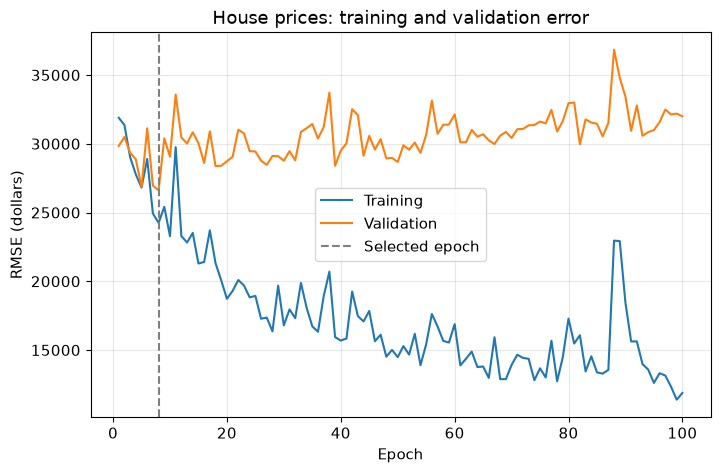

In [37]:
epochs_house = np.arange(1, n_epochs_house + 1)
fig, ax = plt.subplots()
ax.plot(epochs_house, house_history['train_rmse'], label='Training')
ax.plot(epochs_house, house_history['val_rmse'], label='Validation')
ax.axvline(best_house_epoch, color='grey', linestyle='--', label='Selected epoch')
ax.set(xlabel='Epoch', ylabel='RMSE (dollars)', title='House prices: training and validation error')
ax.legend()
ax.grid(alpha=0.3)
plt.show()

### Watch the house-price predictions improve

Each point is a validation house. A perfect prediction would lie on the dashed diagonal. The epoch label matches the predictions saved during training.

In [38]:
fig, ax = plt.subplots(figsize=(6, 6))
house_line, = ax.plot(yh_val, house_predictions[0], 'o', alpha=0.4, markersize=4)
house_limits = [min(0, np.min(house_predictions), yh_val.min()),
                max(np.max(house_predictions), yh_val.max()) * 1.05]
ax.plot(house_limits, house_limits, 'r--', label='Perfect prediction')
ax.set(xlabel='True price (dollars)', ylabel='Predicted price (dollars)',
       xlim=house_limits, ylim=house_limits)
ax.legend()
house_title = ax.set_title('')

def animate_house(frame):
    house_line.set_ydata(house_predictions[frame])
    house_title.set_text(f'Validation predictions: epoch {house_saved_epochs[frame]}')
    return house_line, house_title

house_animation = animation.FuncAnimation(
    fig, animate_house, frames=len(house_predictions), interval=150,
)
plt.close(fig)
display(HTML(house_animation.to_jshtml()))

After choosing the epoch using validation data, we evaluate that model once on the held-out test set.

In [39]:
Xh_test = house_scaler.transform(Xh_test_raw)
best_house_model.eval()
with torch.no_grad():
    house_test_prediction = prices_in_dollars(
        best_house_model(torch.tensor(Xh_test, dtype=torch.float32)).numpy()
    )
print(f'Test MAE: ${mean_absolute_error(yh_test, house_test_prediction):,.0f}')
print(f'Test RMSE: ${np.sqrt(mean_squared_error(yh_test, house_test_prediction)):,.0f}')

Test MAE: $17,263
Test RMSE: $29,683


<h3 style="color: #ff0000;">8.3 Classification of Fashion-MNIST with a neural network</h3>

### Load the data

We return to the Fashion-MNIST images from earlier sessions. Each image has **28 × 28 pixels**, and each label identifies one of **10 clothing categories**.

We load the data through OpenML and normalize pixel values to **[0, 1]**. We retain the standard first 60,000 training/development examples and final 10,000 test examples, and split the development data into training and validation sets.

In [40]:
from sklearn.datasets import fetch_openml

X_fashion, y_fashion = fetch_openml(
    'Fashion-MNIST', version=1, as_frame=False, return_X_y=True,
)
X_fashion = X_fashion.astype(np.float32) / 255.0
y_fashion = y_fashion.astype(int)
Xf_dev, yf_dev = X_fashion[:60000], y_fashion[:60000]
Xf_test, yf_test = X_fashion[60000:], y_fashion[60000:]
Xf_train, Xf_val, yf_train, yf_val = train_test_split(
    Xf_dev, yf_dev, test_size=0.2, stratify=yf_dev, random_state=RANDOM_STATE,
)
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
print(f'Train: {len(yf_train)}, validation: {len(yf_val)}, test: {len(yf_test)}')
print('One image:', Xf_train[0].reshape(28, 28).shape)
print('Flattened input:', Xf_train.shape[1], 'features')

Train: 48000, validation: 12000, test: 10000
One image: (28, 28)
Flattened input: 784 features


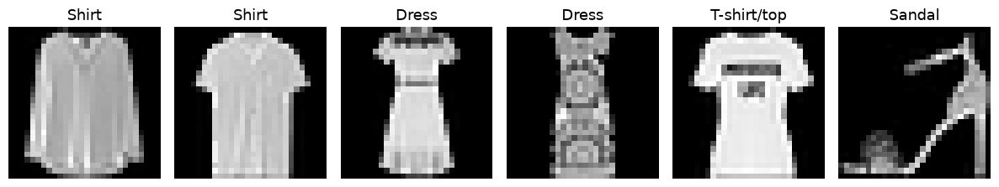

In [41]:
fig, axes = plt.subplots(1, 6, figsize=(12, 3))
for i, ax in enumerate(axes):
    ax.imshow(Xf_train[i].reshape(28, 28), cmap='gray', vmin=0, vmax=1)
    ax.set_title(class_names[yf_train[i]])
    ax.axis('off')
plt.tight_layout()
plt.show()

### Building the first model

We start with the original **784-input, 10-output model with no hidden layer**. OpenML already provides flattened images. Flattening changes an image's shape but adds no trainable parameters.

`nn.Linear(784, 10)` produces ten raw class scores, called **logits**. PyTorch's `nn.CrossEntropyLoss()` takes these logits directly and incorporates the log-softmax calculation internally. **Do not add a softmax layer before this loss.**

When we want to inspect probabilities, we apply `torch.softmax(logits, dim=1)` to the output. This gives the same interpretation as before: ten class probabilities that sum to one.

The image tensors use `float32`, while the class labels use **`torch.long`**, the integer type needed for class-index targets. This simple model is our baseline before the deeper-network exercise.

In [42]:
torch.manual_seed(RANDOM_STATE)
fashion_model = nn.Sequential(nn.Linear(784, 10))
print(fashion_model)
print('Trainable parameters:', sum(p.numel() for p in fashion_model.parameters()))

Sequential(
  (0): Linear(in_features=784, out_features=10, bias=True)
)
Trainable parameters: 7850


### Training and saving checkpoints

We train for **50 epochs**, using the same training loop as before with **cross-entropy loss** and the **Adam optimizer**. After each epoch we calculate training and validation loss and accuracy, and save the current weights and biases using `model.state_dict()`.

The function below also works for your deeper network later. Each run creates its own folder under `save/`, so earlier checkpoints remain available. We choose the best epoch using **validation loss**.

These files contain model parameters for evaluation. To resume training exactly, we would also need to save the optimizer state.

In [43]:
from tempfile import mkdtemp


def evaluate_fashion(model, inputs, targets):
    model.eval()
    with torch.no_grad():
        logits = model(inputs)
        loss = nn.functional.cross_entropy(logits, targets).item()
        accuracy = (logits.argmax(dim=1) == targets).float().mean().item()
    return loss, accuracy


def train_fashion(model, X_train, y_train, X_val, y_val, epochs=50,
                  name='fashion', learning_rate=0.001, batch_size=128):
    Path('save').mkdir(exist_ok=True)
    save_dir = Path(mkdtemp(prefix=name + '_', dir='save'))
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val, dtype=torch.long)
    loader = DataLoader(
        TensorDataset(X_train_tensor, y_train_tensor),
        batch_size=batch_size, shuffle=True,
    )
    loss_function = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    history = []
    best_loss = np.inf

    for epoch in range(1, epochs + 1):
        train_one_epoch(model, loader, loss_function, optimizer)
        train_loss, train_accuracy = evaluate_fashion(model, X_train_tensor, y_train_tensor)
        val_loss, val_accuracy = evaluate_fashion(model, X_val_tensor, y_val_tensor)
        history.append({
            'epoch': epoch, 'train_loss': train_loss, 'val_loss': val_loss,
            'train_accuracy': train_accuracy, 'val_accuracy': val_accuracy,
        })
        torch.save(model.state_dict(), save_dir / f'epoch_{epoch:03d}.pt')
        if val_loss < best_loss:
            best_loss, best_epoch = val_loss, epoch
        if epoch == 1 or epoch % 10 == 0:
            print(f'Epoch {epoch:3d}: validation loss {val_loss:.3f}, '
                  f'accuracy {val_accuracy:.3f}')

    return pd.DataFrame(history), save_dir, best_epoch

In [44]:
fashion_history, fashion_save_dir, best_fashion_epoch = train_fashion(
    fashion_model, Xf_train, yf_train, Xf_val, yf_val,
    epochs=50, name='fashion_baseline', learning_rate=0.001, batch_size=128,
)
print('Best validation epoch:', best_fashion_epoch)

Epoch   1: validation loss 0.563, accuracy 0.816
Epoch  10: validation loss 0.409, accuracy 0.861
Epoch  20: validation loss 0.396, accuracy 0.864
Epoch  30: validation loss 0.398, accuracy 0.864
Epoch  40: validation loss 0.400, accuracy 0.861
Epoch  50: validation loss 0.405, accuracy 0.861
Best validation epoch: 41


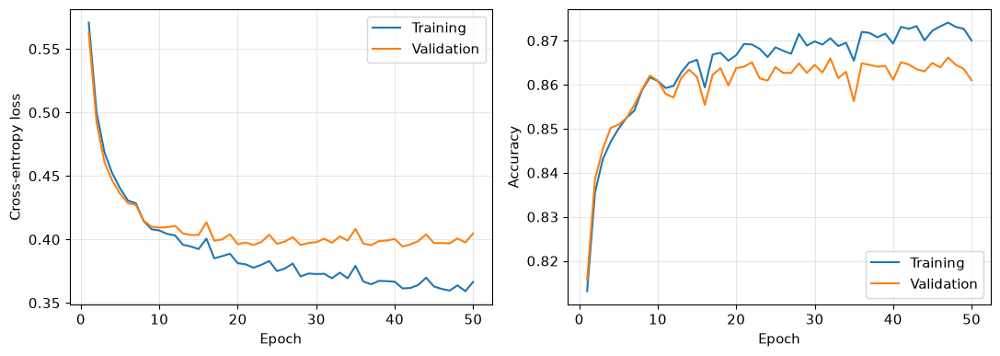

In [45]:
def plot_fashion_history(history):
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(history['epoch'], history['train_loss'], label='Training')
    axes[0].plot(history['epoch'], history['val_loss'], label='Validation')
    axes[0].set(xlabel='Epoch', ylabel='Cross-entropy loss')
    axes[1].plot(history['epoch'], history['train_accuracy'], label='Training')
    axes[1].plot(history['epoch'], history['val_accuracy'], label='Validation')
    axes[1].set(xlabel='Epoch', ylabel='Accuracy')
    for ax in axes:
        ax.legend()
        ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_fashion_history(fashion_history)

### Loading a trained model

We can reload the weights from epochs **1, 12, and 18**, as in the original exercise. We compare them on **validation data**, keeping the test set for the final evaluation.

A `state_dict` contains parameter values, so we first construct a model with the **same architecture**, then load those values with `load_state_dict()`.

In [46]:
checkpoint_results = []
Xf_val_tensor = torch.tensor(Xf_val, dtype=torch.float32)
yf_val_tensor = torch.tensor(yf_val, dtype=torch.long)
for epoch in [1, 12, 18]:
    restored_model = nn.Sequential(nn.Linear(784, 10))
    restored_model.load_state_dict(torch.load(
        fashion_save_dir / f'epoch_{epoch:03d}.pt', weights_only=True,
    ))
    val_loss, val_accuracy = evaluate_fashion(restored_model, Xf_val_tensor, yf_val_tensor)
    checkpoint_results.append({
        'Epoch': epoch, 'Validation loss': val_loss, 'Validation accuracy': val_accuracy,
    })
pd.DataFrame(checkpoint_results).round(3)

,Epoch,Validation loss,Validation accuracy
0,1,0.563,0.816
1,12,0.411,0.857
2,18,0.400,0.864


We now load the checkpoint with the lowest validation loss across all 50 epochs.

In [47]:
best_fashion_model = nn.Sequential(nn.Linear(784, 10))
best_fashion_model.load_state_dict(torch.load(
    fashion_save_dir / f'epoch_{best_fashion_epoch:03d}.pt', weights_only=True,
))
best_fashion_model.eval()
with torch.no_grad():
    fashion_val_logits = best_fashion_model(Xf_val_tensor)
    fashion_val_probability = torch.softmax(fashion_val_logits, dim=1).numpy()
    fashion_val_prediction = fashion_val_logits.argmax(dim=1).numpy()
print(f'Selected epoch: {best_fashion_epoch}')
print(f'Validation accuracy: {accuracy_score(yf_val, fashion_val_prediction):.3f}')

Selected epoch: 41
Validation accuracy: 0.865


### Inspecting one prediction

Each output is a vector of 10 class probabilities. The predicted label is the class with the largest probability.

True label: Sandal
Predicted label: Sandal
Probabilities: [0.    0.    0.001 0.    0.    0.655 0.001 0.196 0.032 0.115]


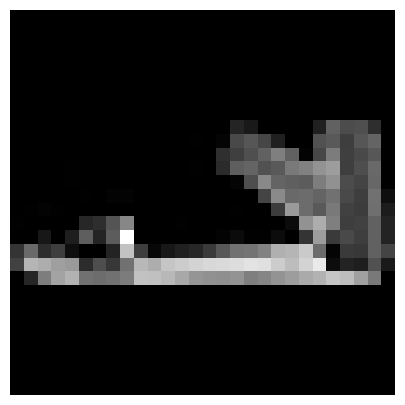

In [48]:
im_id = 0
predicted_label = fashion_val_prediction[im_id]
print('True label:', class_names[yf_val[im_id]])
print('Predicted label:', class_names[predicted_label])
print('Probabilities:', np.round(fashion_val_probability[im_id], 3))
plt.imshow(Xf_val[im_id].reshape(28, 28), cmap='gray', vmin=0, vmax=1)
plt.axis('off')
plt.show()

### Where does the model fail?

We inspect mistakes on validation images to understand what the model finds difficult. This can inform the next architecture we try.

Misclassified validation images: 1619
True label: T-shirt/top
Predicted label: Dress


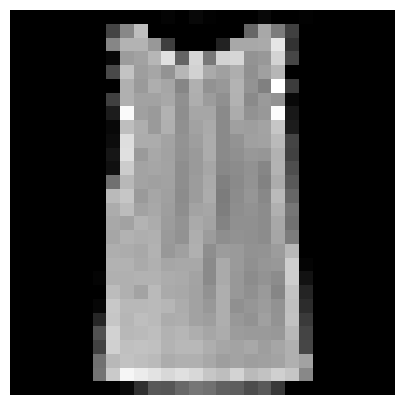

In [49]:
wrong_indices = np.flatnonzero(fashion_val_prediction != yf_val)
print(f'Misclassified validation images: {len(wrong_indices)}')
if len(wrong_indices):
    im_id = wrong_indices[0]
    print('True label:', class_names[yf_val[im_id]])
    print('Predicted label:', class_names[fashion_val_prediction[im_id]])
    plt.imshow(Xf_val[im_id].reshape(28, 28), cmap='gray', vmin=0, vmax=1)
    plt.axis('off')
    plt.show()

## 9. Hands-on exercises

<h3 style="color: #ff0000;">Exercise on your own: train a deeper network for Fashion-MNIST classification</h3>

Make a **deeper model with wider hidden layers**. Use `nn.Linear` for the connections and `nn.ReLU()` between the hidden layers. End with a linear layer producing **10 logits**. As above, `nn.CrossEntropyLoss()` includes the log-softmax calculation, and we apply softmax separately when displaying probabilities.

**Try to achieve 90% validation accuracy. Does your model overfit?** This is a target to explore, not a guaranteed result.

1. Create the model by choosing the layers in `nn.Sequential` and its training settings.
2. Train it with `train_fashion()` and the same training and validation data.
3. Plot the loss and accuracy during training with `plot_fashion_history()`.
4. Reload the weights from the epoch with the lowest validation loss into a model with the same architecture, and compare it with the baseline.

**Hint:** With two hidden layers containing 128 and 64 neurons, the linear connections have shapes `784 → 128`, `128 → 64`, and `64 → 10`. Add a ReLU after each hidden linear layer. You can pass `learning_rate` and `batch_size` to `train_fashion()`.

Keep the test set untouched while trying different architectures.

In [24]:
# 1. Set torch.manual_seed(RANDOM_STATE), then create deeper_model = nn.Sequential(...).
# 2. Call train_fashion(deeper_model, Xf_train, yf_train, Xf_val, yf_val,
#                       epochs=50, name='fashion_deeper').
#    Keep the returned history, checkpoint folder, and best epoch.
# 3. Plot the history with plot_fashion_history(...).
# 4. Create a model with the same architecture and load its selected weights:
#    selected_model.load_state_dict(torch.load(checkpoint_path, weights_only=True))
#    Compare its validation results using evaluate_fashion(...).

### Final evaluation on the test set

Run the next cell **after you have finished choosing your model**. It evaluates the selected baseline by default. After completing the exercise, replace `best_fashion_model` with your selected deeper model if validation results justify that choice.

The cell is commented out to keep the test results hidden during **Run All**. Uncomment it when your model choice is final. Avoid returning to model selection based on the test result.

In [25]:
# final_model = best_fashion_model  # Or your selected deeper model
# final_model.eval()
# with torch.no_grad():
#     test_logits = final_model(torch.tensor(Xf_test, dtype=torch.float32))
#     test_probability = torch.softmax(test_logits, dim=1).numpy()
#     test_prediction = test_logits.argmax(dim=1).numpy()
# print(f'Test loss: {log_loss(yf_test, test_probability, labels=np.arange(10)):.3f}')
# print(f'Test accuracy: {accuracy_score(yf_test, test_prediction):.3f}')
#
# from sklearn.metrics import ConfusionMatrixDisplay
# fig, ax = plt.subplots(figsize=(9, 8))
# ConfusionMatrixDisplay.from_predictions(
#     yf_test, test_prediction, labels=np.arange(10), display_labels=class_names,
#     cmap='Blues', xticks_rotation=90, colorbar=False, ax=ax,
# )
# ax.set_title('Final Fashion-MNIST test predictions')
# plt.tight_layout()
# plt.show()

*API references: [PyTorch training loop](https://docs.pytorch.org/tutorials/beginner/basics/optimization_tutorial.html), [saving and loading parameters](https://docs.pytorch.org/tutorials/beginner/basics/saveloadrun_tutorial.html), and [OpenML datasets](https://docs.openml.org/data/use/).*

## 10. Final notes

A neural network learns weights and biases that transform inputs into predictions. Nonlinear hidden layers allow it to represent more complex relationships.

The **output activation and loss** should match the task. Backpropagation computes gradients, and an optimizer uses them to update parameters.

Choose architecture and training settings with validation data. Assess the final model on unseen test data using metrics that reflect the errors that matter for the task.

**Questions to take away:** What does the model predict? How does the loss define an error? How will you know whether the model generalizes?

## Solutions

### Architecture check
Question: How many trainable parameters does a fully connected network with 2 inputs, one hidden layer of 4 neurons, and 1 output neuron have, including biases?

- **Hidden layer:** $2 \times 4 = 8$ weights + $4$ biases = **12 parameters**
- **Output layer:** $4 \times 1 = 4$ weights + $1$ bias = **5 parameters**

**Total: 17 trainable parameters**

### Fashion-MNIST exercise: deeper network

One possible solution uses two hidden layers with **256 and 128 neurons**. The final layer produces 10 logits, one for each class. ReLU follows each hidden layer, but not the output layer, because `nn.CrossEntropyLoss()` works directly with logits.

This is one reasonable architecture, not the only correct answer. The validation results determine whether it improves on the baseline.

In [26]:
def make_deeper_fashion_model():
    return nn.Sequential(
        nn.Linear(784, 256),
        nn.ReLU(),
        nn.Linear(256, 128),
        nn.ReLU(),
        nn.Linear(128, 10),
    )


torch.manual_seed(RANDOM_STATE)
deeper_model = make_deeper_fashion_model()
print(deeper_model)
print('Trainable parameters:', sum(p.numel() for p in deeper_model.parameters()))

Sequential(
  (0): Linear(in_features=784, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=10, bias=True)
)
Trainable parameters: 235146


We train the candidate for 40 epochs. The function saves a checkpoint after every epoch and identifies the epoch with the lowest validation loss.

Epoch   1: validation loss 0.426, accuracy 0.850


Epoch  10: validation loss 0.308, accuracy 0.894


Epoch  20: validation loss 0.337, accuracy 0.896


Epoch  30: validation loss 0.379, accuracy 0.899


Epoch  40: validation loss 0.422, accuracy 0.904


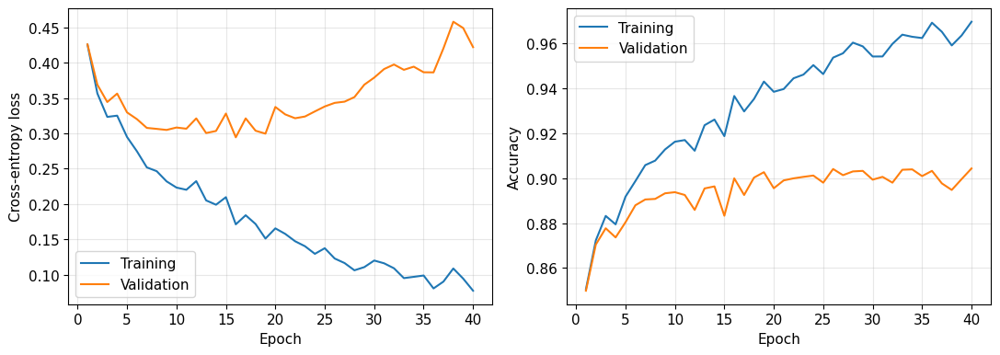

In [27]:
deeper_history, deeper_save_dir, best_deeper_epoch = train_fashion(
    deeper_model,
    Xf_train,
    yf_train,
    Xf_val,
    yf_val,
    epochs=40,
    name='fashion_deeper_solution',
    learning_rate=0.001,
    batch_size=128,
)

plot_fashion_history(deeper_history)

### Selecting the checkpoint

We now recreate the same architecture and load the parameters from the epoch with the lowest validation loss. We then compare this selected model with the selected baseline on the same validation data.

In [28]:
selected_deeper_model = make_deeper_fashion_model()
selected_deeper_model.load_state_dict(torch.load(
    deeper_save_dir / f'epoch_{best_deeper_epoch:03d}.pt',
    weights_only=True,
))

baseline_val_loss, baseline_val_accuracy = evaluate_fashion(
    best_fashion_model, Xf_val_tensor, yf_val_tensor,
)
deeper_val_loss, deeper_val_accuracy = evaluate_fashion(
    selected_deeper_model, Xf_val_tensor, yf_val_tensor,
)

comparison = pd.DataFrame({
    'Model': ['Baseline: no hidden layer', 'Deeper: 256 and 128'],
    'Selected epoch': [best_fashion_epoch, best_deeper_epoch],
    'Validation loss': [baseline_val_loss, deeper_val_loss],
    'Validation accuracy': [baseline_val_accuracy, deeper_val_accuracy],
})
comparison.round(3)

,Model,Selected epoch,Validation loss,Validation accuracy
0,Baseline: no hidden layer,41,0.394,0.865
1,Deeper: 256 and 128,16,0.294,0.900


### Does the deeper model overfit?

Overfitting appears when training performance continues to improve while validation performance stops improving or deteriorates. The next cell compares the selected epoch with the final epoch.

In [29]:
selected_row = deeper_history.loc[
    deeper_history['epoch'] == best_deeper_epoch
].iloc[0]
final_row = deeper_history.iloc[-1]

print(f'Selected epoch: {best_deeper_epoch}')
print(f"Selected training loss:   {selected_row['train_loss']:.3f}")
print(f"Selected validation loss: {selected_row['val_loss']:.3f}")
print(f"Final training loss:      {final_row['train_loss']:.3f}")
print(f"Final validation loss:    {final_row['val_loss']:.3f}")

if (final_row['train_loss'] < selected_row['train_loss'] and
        final_row['val_loss'] > selected_row['val_loss']):
    print('The later epochs show overfitting: training loss falls while validation loss rises.')
else:
    print('These epochs do not show a clear increase in overfitting after the selected point.')

Selected epoch: 16
Selected training loss:   0.171
Selected validation loss: 0.294
Final training loss:      0.078
Final validation loss:    0.422
The later epochs show overfitting: training loss falls while validation loss rises.


The best checkpoint may not be the epoch with the highest validation accuracy. We select by **validation loss** because it also considers the quality of the predicted probabilities, not only whether the most probable class is correct.

### Final test evaluation

Architecture and checkpoint selection are now complete. We evaluate the selected deeper model once on the untouched test set.

In [30]:
Xf_test_tensor = torch.tensor(Xf_test, dtype=torch.float32)
yf_test_tensor = torch.tensor(yf_test, dtype=torch.long)
test_loss, test_accuracy = evaluate_fashion(
    selected_deeper_model, Xf_test_tensor, yf_test_tensor,
)

selected_deeper_model.eval()
with torch.no_grad():
    test_logits = selected_deeper_model(Xf_test_tensor)
    test_prediction = test_logits.argmax(dim=1).numpy()

print(f'Test loss: {test_loss:.3f}')
print(f'Test accuracy: {test_accuracy:.3f}')

Test loss: 0.332
Test accuracy: 0.889


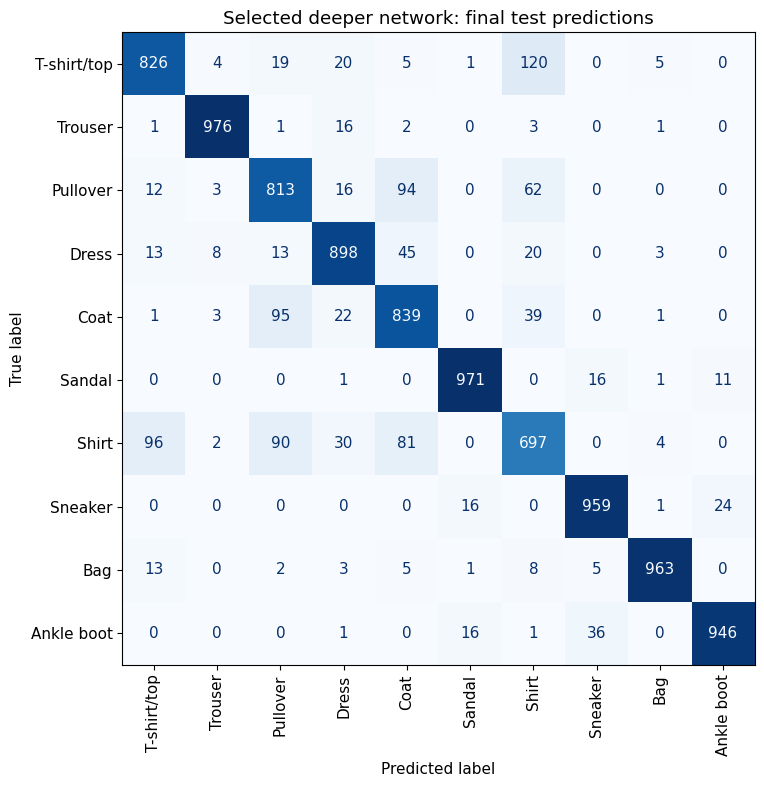

In [31]:
from sklearn.metrics import ConfusionMatrixDisplay

fig, ax = plt.subplots(figsize=(9, 8))
ConfusionMatrixDisplay.from_predictions(
    yf_test,
    test_prediction,
    labels=np.arange(10),
    display_labels=class_names,
    cmap='Blues',
    xticks_rotation=90,
    colorbar=False,
    ax=ax,
)
ax.set_title('Selected deeper network: final test predictions')
plt.tight_layout()
plt.show()

The confusion matrix shows which clothing categories remain difficult to distinguish. Fashion-MNIST commonly contains visually similar classes, so the mistakes are not distributed equally across all categories.

The test result is the final estimate of performance. We should not return to architecture selection after seeing it; doing so would allow the test data to influence the model.